<table>
<tr>    
<td style="text-align: center">
<h1>Konwolucyjne sieci neuronowe CNN</h1>
<h2><a href="http://home.agh.edu.pl/~horzyk/index.php">Adrian Horzyk</a></h2>
</td> 
<td>
<img src="http://home.agh.edu.pl/~horzyk/im/AdrianHorzyk49BT140h.png" alt="Adrian Horzyk, Professor" title="Adrian Horzyk, Professor" />        
</td> 
</tr>
</table>
<h3><i>Zapraszam do interaktywnego notebooka, w którym możesz dowiedzieć się, jak działają sieci neuronowe, doświadczysz i sprawdzisz ich działanie na wybranych zbiorach danych i przeprowadzisz własne eksperymenty!</i></h3>

# Konwolucyjne sieci neuronowe

stały się bardzo popularne, ponieważ skutecznie radzą sobie z wieloma problemami, szczególnie w przypadku obrazów, które można poprawnie rozpoznać lub sklasyfikować niezależnie od ruchu obiektów w polu widzenia, co było dużym ograniczeniem sieci MLP (tylko warstwy gęste).

Konwolucyjne sieci neuronowe (CNN) mogą hierarchicznie wyodrębniać ważne podwzorce, które służą do definiowania cech wyższego rzędu, które pozwalają gęstym warstwom klasyfikować obrazy wejściowe z większą łatwością i dokładnością.

Teraz spróbujemy wytrenować takie sieci przy użyciu zbioru danych MNIST, aby sprawdzić, czy uda nam się osiągnąć lepszą wydajność i dokładność modeli opartych na CNN w porównaniu z poprzednimi modelami MLP (tylko gęste warstwy).

In [5]:
'''Trains a simple ConvNet on the MNIST dataset. It gets over 99.6% validation accuracy after ~50 epochs
(but there is still a margin for hyperparameter tuning). Training can take an hour or so!'''

# Import libraries
from __future__ import print_function
import numpy as np
import math
from math import ceil
import tensorflow as tf
import os   
import seaborn as sns
import matplotlib.pyplot as plt  # library for plotting math functions
import pandas as pd
import keras   # Import keras framework with various functions, models and structures
from keras.datasets import mnist # gets MNIST dataset from repository
from keras import layers
from keras import models
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from keras import optimizers
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from keras.datasets import mnist
import tensorflow
from tensorflow.keras.utils import to_categorical
from keras import regularizers

# Set parameters for plots
%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

print ("TensorFlow version: " + tf.__version__)
print ("Keras version: " + keras.__version__)

TensorFlow version: 2.16.1
Keras version:3.0.5


### Utwórz lub wybierz katalog do przechowywania wytrenowanych modeli.

In [13]:
# The path to the directory for storing and loading our models
models_dir = '~/Documents/Programming/Python/GGSN/lab3/models/'
models_dir = os.path.expanduser(models_dir)

if not os.path.exists(models_dir):
    os.mkdir(models_dir)
    
# The path to the directory where the dataset are stored
# original_dataset_dir = 'C:/ml/data/kaggle/original/train'

In [15]:
# Split the data between train and validation sets. Here we are using only two sets for model training and validation.
(x_train, y_train), (x_val, y_val) = mnist.load_data() # 60000 training and 10000 validating examples

# Number of training and val data
num_train_data = x_train.shape[0]
num_val_data = x_val.shape[0]

# Input image dimensions
img_rows, img_cols = x_train.shape[1], x_train.shape[2]

num_classes = np.size(np.unique(y_train))    # number of unique labels = number of classes of digits: 0, 1, 2, ..., 9
print ('Number of classes: ', num_classes)

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers training data of various classes: ', np.unique(y_train, return_counts=True))

## Distribution of the numbers training data of various classes
print ('Distribution of the numbers validation data of various classes: ', np.unique(y_val, return_counts=True))

Number of classes:  10
Distribution of the numbers training data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([5923, 6742, 5958, 6131, 5842, 5421, 5918, 6265, 5851, 5949]))
Distribution of the numbers validation data of various classes:  (array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8), array([ 980, 1135, 1032, 1010,  982,  892,  958, 1028,  974, 1009]))


Kilka przykładów danych MNIST:

<Figure size 250x250 with 0 Axes>

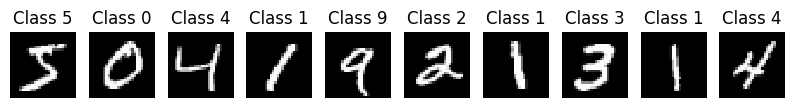

<Figure size 100x100 with 0 Axes>

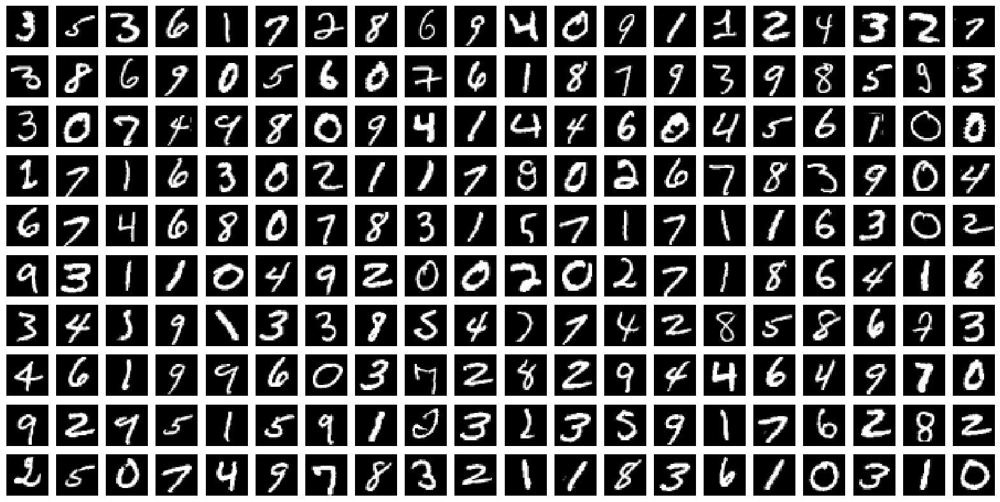

In [16]:
# Show a few sample digits from the training set
plt.figure(figsize=(2.5,2.5))
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()

# Show a few sample digits from the training set
plt.figure(figsize=(1.0,1.0))
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

Zmień kształt (tensora) i przekształć dane do oczekiwanych typów i zakresów:

In [17]:
# According to the different formats reshape training and validation data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255   # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255    # Transfrom the validation data from the range of 0 and 255 to the range of 0 and 1

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validation samples')

# Convert class vectors (integers) to binary class matrices using as specific 
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes) # y_train - a converted class vector into a matrix (integers from 0 to num_classes)
y_val = tensorflow.keras.utils.to_categorical(y_val, num_classes) # y_val - a converted class vector into a matrix (integers from 0 to num_classes)

x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 validation samples


## Wprowadzenie do ConvNets

Najpierw przyjrzyjmy się bardzo prostemu przykładowi convnet. Będziemy używać convnet do klasyfikowania cyfr MNIST, co już wykonałeś, o czym już wspominaliśmy i osiągnęliśmy dokładność walidacji ~ 98%). Chociaż nasza pierwsza sieć będzie bardzo prosta, jej dokładność będzie przewyższać poprzedni model o gęstych połączeniach.

Aby zbudować podstawową sieć komunikacyjną, używamy małego stosu warstw „Conv2D” i „MaxPooling2D”.

Ta sieć przyjmuje jako wejściowe tensory kształtu `(image_height, image_width, image_channels)` (tzn.`(wysokość_obrazu, szerokość_obrazu, kanały_obrazu)`) (nie licząc wymiaru wsadowego). Skonfigurujemy naszą sieć convnet tak, aby przetwarzała dane wejściowe o rozmiarze `(28, 28, 1)` poprzez przekazanie argumentu `input_shape=(28, 28, 1)` do naszej pierwszej warstwy.

In [20]:
# A simple CONVNET model for MNIST data
model1 = models.Sequential()
model1.add(layers.Input(shape=(img_rows, img_cols, 1)))
model1.add(layers.Conv2D(32, (3, 3), activation='relu'))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
model1.add(layers.MaxPooling2D((2, 2)))
model1.add(layers.Conv2D(64, (3, 3), activation='relu'))
# Flatten the output to input data to the Dense layer
model1.add(layers.Flatten())
# Dense layers - similar to the previous model, but using the smaller number of units
model1.add(layers.Dense(64, activation='relu'))
model1.add(layers.Dense(num_classes, activation='softmax'))

model1.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 11, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 3, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 93,322 (364.54 KB)

 Trainable params: 93,322 (364.54 KB)

 Non-trainable params: 0 (0.00 B)

Można zauważyć, że wynikiem każdej warstwy `Conv2D` i `MaxPooling2D` jest tensor 3D kształtu `(height, width, channels)`, czyli „(wysokość, szerokość, kanały)”. Wymiary szerokości i wysokości mają tendencję do zmniejszania się w miarę wchodzenia głębiej w sieć. Liczba kanałów jest kontrolowana przez pierwszy argument (hiperparametr) przekazywany do warstw `Conv2D` (np. 32 lub 64) i jest ustawiana przez programistę (tj. nie jest automatycznie optymalizowana przez model).

Następnym krokiem byłoby wprowadzenie naszego ostatniego tensora wyjściowego (o kształcie `(3, 3, 64)`) do gęsto połączonej sieci klasyfikatorów, takiej jak te, które już znasz – stos „gęstych” warstw `Dense`, ale gęsta klasyfikatory wymagają wektora (tensora 1D) na wejściu, więc musimy najpierw spłaszczyć nasze wyniki 3D do 1D, a następnie dodać kilka „gęstych” warstw `Dense`.

Jak widać, nasze wyniki `(3, 3, 64)` zostały spłaszczone do wektorów o kształcie `(576,)` przed przejściem przez dwie warstwy „Gęste”.

Zauważmy, że nasz poprzedni model gęsty miał około 4 razy więcej parametrów (wag) niż powyższy model convnet!

Teraz nauczmy naszą sieć na cyfrach MNIST i porównajmy wyniki:

In [22]:
# Set up the basic hyperparameters
epochs = 50       # the number of training epochs
batch_size = 256  # the size of mini-batches used for training the network in one step

#early_stopping = EarlyStopping(monitor='val_loss', patience=2)
#model.fit(x, y, validation_split=0.2, callbacks=[early_stopping])

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

# Save weights of the model before training to enable to start training it again
model1.save_weights(models_dir + 'CNN_MNIST_1_weights_init.weights.h5')

history1 = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size, validation_data=(x_val, y_val))

Epoch 1/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 60s 237ms/step - acc: 0.7391 - loss: 0.7853 - val_acc: 0.9658 - val_loss: 0.1048
Epoch 2/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 55s 232ms/step - acc: 0.9742 - loss: 0.0852 - val_acc: 0.9792 - val_loss: 0.0628
Epoch 3/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 70s 182ms/step - acc: 0.9838 - loss: 0.0513 - val_acc: 0.9799 - val_loss: 0.0586
Epoch 4/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 47s 199ms/step - acc: 0.9892 - loss: 0.0353 - val_acc: 0.9906 - val_loss: 0.0310
Epoch 5/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 47s 200ms/step - acc: 0.9911 - loss: 0.0280 - val_acc: 0.9878 - val_loss: 0.0379
Epoch 6/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 51s 217ms/step - acc: 0.9929 - loss: 0.0217 - val_acc: 0.9867 - val_loss: 0.0420
Epoch 7/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 51s 216ms/step - acc: 0.9939 - loss: 0.0191 - val_acc: 0.9922 - val_loss: 0.0279
Epoch 8/50
235/235 ━━━━━━━━━━━━━━━━━━━━ 48s 201ms/step - acc: 0.9957 - loss: 0.0149 - val_acc: 0.9937 - val_loss: 0.0220
Epoch 9/50
235/235 ━━━━━━━━━━━━━

In [23]:
### Save the trained model for future use or comparisons
model1.save(models_dir + 'CNN_MNIST_1b.h5')

In [24]:
# Evaluate the model and print out the final scores for the validation set
val_loss1, val_acc1 = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1)
print('validation loss:', val_loss1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - acc: 0.9911 - loss: 0.0677
validation accuracy: 0.9937999844551086
validation loss: 0.051846444606781006


Możemy zauważyć, że uczenie sieci convnet zajmuje znacznie więcej czasu niż w przypadku naszej sieci o gęstej bazie; jednak uzyskane wyniki na zestawie walidacyjnym są znacznie lepsze. Teraz osiągnęliśmy ~99,3% zamiast ~98% po tej samej liczbie cykli uczenia, stosując czterokrotnie mniej parametrów! Oznacza to więc, iż nie zawsze "więcej znaczy lepiej", ale tutaj często więcej może oznaczać gorzej, gdyż prowadzi do przeuczenia się modeli.

In [25]:
argmax = np.argmin(history1.history['val_acc'])
acc_max = history1.history['val_acc'][argmax]
print ('The best accuracy ', acc_max, ' for validation set we achieved in epoch: ', argmax)

The best accuracy  0.9657999873161316  for validation set we achieved in epoch:  0


In [26]:
argmin = np.argmin(history1.history['val_loss'])
loss_min = history1.history['val_loss'][argmin]
print ('Overfitting stated after epoch: ', argmin, 'where the mininum loss was ', loss_min)

Overfitting stated after epoch:  7 where the mininum loss was  0.02201271243393421


In [27]:
# Set the number of training epochs to this value to stop training before overfitting and results on the validation set
epochs = argmin       # the number of training epochs
# and restart the training process again for this number of epochs:

In [30]:
#model1.load_model(model_dir + 'CNN_MNIST_1a.h5')   # open the model which was saved before the start of its training
model1.load_weights(models_dir + 'CNN_MNIST_1_weights_init.weights.h5')

model1.compile(optimizer='rmsprop',
                loss='categorical_crossentropy',
                metrics=['acc'])

history1b = model1.fit(x_train, y_train, epochs = epochs, batch_size = batch_size)

/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 12 variables whereas the saved optimizer has 2 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


Epoch 1/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 47s 186ms/step - acc: 0.7436 - loss: 0.7735
Epoch 2/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 74s 154ms/step - acc: 0.9723 - loss: 0.0892
Epoch 3/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - acc: 0.9850 - loss: 0.0476
Epoch 4/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - acc: 0.9883 - loss: 0.0381
Epoch 5/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - acc: 0.9906 - loss: 0.0298
Epoch 6/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - acc: 0.9926 - loss: 0.0229
Epoch 7/7
235/235 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - acc: 0.9945 - loss: 0.0170


In [31]:
model1.save(models_dir + 'CNN_MNIST_1c.h5')

In [32]:
# Evaluate the model and print out the final scores for the validation set
val_loss1b, val_acc1b = model1.evaluate(x_val, y_val)
print('validation accuracy:', val_acc1b)
print('validation loss:', val_loss1b)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - acc: 0.9891 - loss: 0.0331
validation accuracy: 0.9921000003814697
validation loss: 0.024670861661434174


W kolejnych krokach powinniśmy spróbować zmodyfikować naszą ConvNet, aby osiągnąć jeszcze lepsze wyniki.

## Zaawansowana sieć ConvNet dla danych MNIST

Najpierw konstruujemy głębszą sieć ConvNet z warstwami Dropout i stosujemy regularyzację.

Następnie wykorzystujemy powielanie danych treningowych przez ich przekształcenia (augmentation) oraz kontrolę i adaptację wartości szybkości uczenia się.

## Utwórz bardziej rozbudowaną strukturę sieci

In [33]:
from keras import regularizers

# Define the sequential Keras model composed of a few layers
model2 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model2.add(Conv2D(filters=32, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
# model2.add(Conv2D(32, (3, 3), activation='relu')) - shoter way of the above code
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.20)) # Implements the drop out with the probability of 0.20
model2.add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.25))
model2.add(Conv2D(128,(3, 3), activation='relu',padding='same'))
model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.30))
model2.add(Conv2D(128,(3, 3), activation='relu',padding='same')) #256
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.40))
model2.add(Conv2D(256,(3, 3), activation='relu',padding='same')) #512
#model2.add(MaxPooling2D(pool_size=(2, 2)))
model2.add(Dropout(0.50))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model2.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model2.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l1(0.001)))
model2.add(Dropout(0.35))
model2.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l1(0.001))) #128
model2.add(Dropout(0.25))
model2.add(Dense(num_classes, activation='softmax'))

# Now print the full model, which will include the layers of the base model plus the dense layer we added
print(model2.summary())

/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 6, 6, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 3, 3, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 3, 3, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 839,370 (3.20 MB)

 Trainable params: 839,370 (3.20 MB)

 Non-trainable params: 0 (0.00 B)

None


## Skompiluj i naucz sieć

In [34]:
# Define hyperparameters
epochs = 50       # the number of training epochs
batch_size = 128  # the size of mini-batches used for training the network in one step

# Choose the optimizer that will be used: https://keras.io/api/optimizers/
#opt = optimizers.Adam(learning_rate=0.001) #, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam") # https://keras.io/api/optimizers/adam/
#opt = optimizers.Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta", **kwargs)  # https://keras.io/api/optimizers/adadelta/
#opt = optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07, name="Adagrad", **kwargs)  # https://keras.io/api/optimizers/adagrad/
#opt = optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax", **kwargs)  # https://keras.io/api/optimizers/adamax/
#opt = optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam", **kwargs)  # https://keras.io/api/optimizers/Nadam/
#opt = optimizers.Ftrl(learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0, beta=0.0, **kwargs)  # https://keras.io/api/optimizers/ftrl/
#opt = optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop", **kwargs) # https://keras.io/api/optimizers/rmsprop/
#opt = optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD", **kwargs)  # https://keras.io/api/optimizers/sgd/
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001)

# Compile the model using optimizer and the chosen metric: sparse_categorical_crossentropy or categorical_crossentropy etc.
model2.compile(loss=keras.losses.categorical_crossentropy, # choose the metric: https://keras.io/api/metrics/
              optimizer=opt,  # choose the optimizer
              metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction during the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
         factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
         patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
         verbose=1,  # 0: quiet, 1: update messages.
         min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
        rotation_range=10, # rotate images in degrees up to the given degrees
        zoom_range=0.2, # zoom images
        width_shift_range=0.15,  # shift images horizontally
        height_shift_range=0.15)  # shift images vertically
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train) # Fits the data generator to the sample data x_train.

# Simple train the model, validate, evaluate, and present scores
'''history = model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,  # no of training epochs
          verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
          validation_data=(x_val, y_val),
          validation_split=0.2,  # cross-validation split 1/5
          shuffle=True) # method of how to shuffle training and validation data '''

# Advanced train the model, validate, evaluate, and present scores: https://keras.io/models/model/#fit_generator
#history2 = model2.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history2 = model2.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,  # no of training epochs
                            steps_per_epoch=x_train.shape[0]//batch_size, # no of mini-batches
                            validation_data=(x_val, y_val),
                            verbose=1,  # 0 = silent, 1 = progress bar, 2 = one line per epoch
                            callbacks=[learning_rate_reduction])

Epoch 1/50


/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


468/468 ━━━━━━━━━━━━━━━━━━━━ 146s 296ms/step - acc: 0.2568 - loss: 3.5531 - val_acc: 0.9537 - val_loss: 0.4665 - learning_rate: 0.0010
Epoch 2/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:25 311ms/step - acc: 0.8906 - loss: 0.7605

2024-04-19 20:00:34.703647: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


468/468 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - acc: 0.8906 - loss: 0.3811 - val_acc: 0.9542 - val_loss: 0.4672 - learning_rate: 0.0010
Epoch 3/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 138s 295ms/step - acc: 0.8834 - loss: 0.6862 - val_acc: 0.9826 - val_loss: 0.2821 - learning_rate: 0.0010
Epoch 4/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:06 270ms/step - acc: 0.9453 - loss: 0.4127

2024-04-19 20:02:58.527455: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - acc: 0.9453 - loss: 0.2068 - val_acc: 0.9832 - val_loss: 0.2818 - learning_rate: 0.0010
Epoch 5/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 137s 291ms/step - acc: 0.9353 - loss: 0.4731 - val_acc: 0.9840 - val_loss: 0.2626 - learning_rate: 0.0010
Epoch 6/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:09 277ms/step - acc: 0.9297 - loss: 0.6416

2024-04-19 20:05:20.704957: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - acc: 0.9297 - loss: 0.3215 - val_acc: 0.9839 - val_loss: 0.2628 - learning_rate: 0.0010
Epoch 7/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 139s 295ms/step - acc: 0.9485 - loss: 0.4083 - val_acc: 0.9866 - val_loss: 0.2391 - learning_rate: 0.0010
Epoch 8/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:04 395ms/step - acc: 0.9453 - loss: 0.4672

2024-04-19 20:07:44.696930: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9453 - loss: 0.2341 - val_acc: 0.9869 - val_loss: 0.2378 - learning_rate: 0.0010
Epoch 9/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 271s 579ms/step - acc: 0.9567 - loss: 0.3709 - val_acc: 0.9867 - val_loss: 0.2349 - learning_rate: 0.0010
Epoch 10/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:35 461ms/step - acc: 0.9609 - loss: 0.3605

2024-04-19 20:12:21.317701: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - acc: 0.9609 - loss: 0.1806 - val_acc: 0.9868 - val_loss: 0.2342 - learning_rate: 0.0010
Epoch 11/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 190s 315ms/step - acc: 0.9603 - loss: 0.3520 - val_acc: 0.9912 - val_loss: 0.2150 - learning_rate: 0.0010
Epoch 12/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:56 506ms/step - acc: 0.9531 - loss: 0.3326

2024-04-19 20:15:37.945134: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9531 - loss: 0.1667 - val_acc: 0.9909 - val_loss: 0.2142 - learning_rate: 0.0010
Epoch 13/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 148s 315ms/step - acc: 0.9644 - loss: 0.3268 - val_acc: 0.9926 - val_loss: 0.1959 - learning_rate: 0.0010
Epoch 14/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:51 495ms/step - acc: 0.9844 - loss: 0.2855

2024-04-19 20:18:11.725409: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9844 - loss: 0.1430 - val_acc: 0.9924 - val_loss: 0.1961 - learning_rate: 0.0010
Epoch 15/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 193s 308ms/step - acc: 0.9663 - loss: 0.3146 - val_acc: 0.9938 - val_loss: 0.1948 - learning_rate: 0.0010
Epoch 16/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:35 333ms/step - acc: 1.0000 - loss: 0.2078

2024-04-19 20:21:30.130043: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - acc: 1.0000 - loss: 0.1041 - val_acc: 0.9937 - val_loss: 0.1951 - learning_rate: 0.0010
Epoch 17/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 147s 313ms/step - acc: 0.9694 - loss: 0.3036 - val_acc: 0.9925 - val_loss: 0.1979 - learning_rate: 0.0010
Epoch 18/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:51 368ms/step - acc: 0.9688 - loss: 0.2863

2024-04-19 20:24:02.356214: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9688 - loss: 0.1434 - val_acc: 0.9927 - val_loss: 0.1988 - learning_rate: 0.0010
Epoch 19/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 146s 311ms/step - acc: 0.9698 - loss: 0.2953 - val_acc: 0.9923 - val_loss: 0.1944 - learning_rate: 0.0010
Epoch 20/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:07 401ms/step - acc: 0.9531 - loss: 0.2886

2024-04-19 20:26:34.147519: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9531 - loss: 0.1446 - val_acc: 0.9932 - val_loss: 0.1935 - learning_rate: 0.0010
Epoch 21/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 640s 1s/step - acc: 0.9725 - loss: 0.2831 - val_acc: 0.9931 - val_loss: 0.2038 - learning_rate: 0.0010
Epoch 22/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 2:35 333ms/step - acc: 1.0000 - loss: 0.2249

2024-04-19 20:37:19.451257: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - acc: 1.0000 - loss: 0.1127 - val_acc: 0.9931 - val_loss: 0.2035 - learning_rate: 0.0010
Epoch 23/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 1331s 3s/step - acc: 0.9739 - loss: 0.2802 - val_acc: 0.9926 - val_loss: 0.1943 - learning_rate: 0.0010
Epoch 24/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:37 465ms/step - acc: 0.9766 - loss: 0.2292

2024-04-19 20:59:35.948390: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9766 - loss: 0.1148 - val_acc: 0.9931 - val_loss: 0.1935 - learning_rate: 0.0010
Epoch 25/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 151s 323ms/step - acc: 0.9734 - loss: 0.2783 - val_acc: 0.9929 - val_loss: 0.1854 - learning_rate: 0.0010
Epoch 26/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:27 445ms/step - acc: 0.9922 - loss: 0.2002

2024-04-19 21:02:13.233295: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9922 - loss: 0.1003 - val_acc: 0.9928 - val_loss: 0.1872 - learning_rate: 0.0010
Epoch 27/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 151s 321ms/step - acc: 0.9732 - loss: 0.2775 - val_acc: 0.9938 - val_loss: 0.1981 - learning_rate: 0.0010
Epoch 28/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:52 498ms/step - acc: 0.9766 - loss: 0.4213

2024-04-19 21:04:49.993700: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9766 - loss: 0.2111 - val_acc: 0.9939 - val_loss: 0.1979 - learning_rate: 0.0010
Epoch 29/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 149s 317ms/step - acc: 0.9752 - loss: 0.2741 - val_acc: 0.9932 - val_loss: 0.1912 - learning_rate: 0.0010
Epoch 30/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:35 461ms/step - acc: 0.9922 - loss: 0.2269

2024-04-19 21:07:24.769037: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9922 - loss: 0.1137 - val_acc: 0.9932 - val_loss: 0.1911 - learning_rate: 0.0010
Epoch 31/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 198s 423ms/step - acc: 0.9772 - loss: 0.2631 - val_acc: 0.9929 - val_loss: 0.2030 - learning_rate: 0.0010
Epoch 32/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:30 451ms/step - acc: 0.9688 - loss: 0.2527

2024-04-19 21:10:48.981413: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - acc: 0.9688 - loss: 0.1266 - val_acc: 0.9930 - val_loss: 0.2034 - learning_rate: 0.0010
Epoch 33/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 228s 486ms/step - acc: 0.9770 - loss: 0.2658 - val_acc: 0.9941 - val_loss: 0.1904 - learning_rate: 0.0010
Epoch 34/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:07 402ms/step - acc: 0.9688 - loss: 0.3191

2024-04-19 21:14:43.586118: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9688 - loss: 0.1599 - val_acc: 0.9940 - val_loss: 0.1904 - learning_rate: 0.0010
Epoch 35/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 157s 335ms/step - acc: 0.9779 - loss: 0.2580 - val_acc: 0.9942 - val_loss: 0.2020 - learning_rate: 0.0010
Epoch 36/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 5:01 645ms/step - acc: 1.0000 - loss: 0.1915

2024-04-19 21:17:27.219154: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 1.0000 - loss: 0.0959 - val_acc: 0.9942 - val_loss: 0.2015 - learning_rate: 0.0010
Epoch 37/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 148s 316ms/step - acc: 0.9793 - loss: 0.2583 - val_acc: 0.9942 - val_loss: 0.1950 - learning_rate: 0.0010
Epoch 38/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:22 433ms/step - acc: 0.9688 - loss: 0.3026

2024-04-19 21:20:01.667780: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9688 - loss: 0.1516 - val_acc: 0.9942 - val_loss: 0.1957 - learning_rate: 0.0010
Epoch 39/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 150s 320ms/step - acc: 0.9779 - loss: 0.2698 - val_acc: 0.9952 - val_loss: 0.1910 - learning_rate: 0.0010
Epoch 40/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 4:21 560ms/step - acc: 0.9922 - loss: 0.1938

2024-04-19 21:22:38.000799: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9922 - loss: 0.0971 - val_acc: 0.9952 - val_loss: 0.1916 - learning_rate: 0.0010
Epoch 41/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 146s 310ms/step - acc: 0.9791 - loss: 0.2641 - val_acc: 0.9943 - val_loss: 0.1834 - learning_rate: 0.0010
Epoch 42/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:10 408ms/step - acc: 0.9844 - loss: 0.2196

2024-04-19 21:25:09.419446: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9844 - loss: 0.1100 - val_acc: 0.9940 - val_loss: 0.1836 - learning_rate: 0.0010
Epoch 43/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 149s 318ms/step - acc: 0.9807 - loss: 0.2473 - val_acc: 0.9952 - val_loss: 0.1969 - learning_rate: 0.0010
Epoch 44/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:49 492ms/step - acc: 0.9922 - loss: 0.2514

2024-04-19 21:27:44.605331: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9922 - loss: 0.1260 - val_acc: 0.9953 - val_loss: 0.1961 - learning_rate: 0.0010
Epoch 45/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 154s 328ms/step - acc: 0.9795 - loss: 0.2571 - val_acc: 0.9943 - val_loss: 0.1945 - learning_rate: 0.0010
Epoch 46/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:44 480ms/step - acc: 0.9766 - loss: 0.3676

2024-04-19 21:30:25.028149: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - acc: 0.9766 - loss: 0.1842 - val_acc: 0.9939 - val_loss: 0.1949 - learning_rate: 0.0010
Epoch 47/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 151s 322ms/step - acc: 0.9788 - loss: 0.2685 - val_acc: 0.9945 - val_loss: 0.2159 - learning_rate: 0.0010
Epoch 48/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:48 490ms/step - acc: 0.9609 - loss: 0.3561

2024-04-19 21:33:01.906068: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - acc: 0.9609 - loss: 0.1784 - val_acc: 0.9943 - val_loss: 0.2165 - learning_rate: 0.0010
Epoch 49/50
468/468 ━━━━━━━━━━━━━━━━━━━━ 150s 320ms/step - acc: 0.9802 - loss: 0.2694 - val_acc: 0.9949 - val_loss: 0.1942 - learning_rate: 0.0010
Epoch 50/50
  1/468 ━━━━━━━━━━━━━━━━━━━━ 3:32 455ms/step - acc: 0.9688 - loss: 0.2536

2024-04-19 21:35:38.036311: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


468/468 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - acc: 0.9688 - loss: 0.1271 - val_acc: 0.9952 - val_loss: 0.1950 - learning_rate: 0.0010


In [36]:
### Save the trained model for future use or comparisons
model2.save(models_dir + 'CNN_MNIST_2.h5')

## Oceń, porównaj i zrób wykresy uzyskanej dokładności (accuracy) i straty (loss)

In [37]:
import matplotlib.pyplot as plt  # library for plotting math functions: https://matplotlib.org/stable/index.html
    
def PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(acc1))
    plt.plot(epochs, acc1, 'bo', label='Training accuracy for ' + lab1)
    plt.plot(epochs, val_acc1, 'b', label='Validation accuracy for ' + lab1)
    plt.plot(epochs, acc2, 'ro', label='Training accuracy for ' + lab2)
    plt.plot(epochs, val_acc2, 'r', label='Validation accuracy for ' + lab2)
    plt.title('Comparison of Training and Validation Accuracies')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(['Train Acc 1', 'Val Acc 1', 'Train Acc 2', 'Val Acc 2'], loc='lower right')
    plt.show()
    
def PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, lab1 = 'Model 1', lab2 = 'Model 2'):
    #plt.clf()   # clear figure
    plt.rcParams['image.interpolation'] = 'nearest'
    plt.rcParams['image.cmap'] = 'gray'
    plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots
    epochs = range(len(loss1))
    plt.plot(epochs, loss1, 'bo', label='Training loss for ' + lab1)
    plt.plot(epochs, val_loss1, 'b', label='Validation loss for ' + lab1)
    plt.plot(epochs, loss2, 'ro', label='Training loss for ' + lab2)
    plt.plot(epochs, val_loss2, 'r', label='Validation loss for ' + lab2)
    plt.title('Comparison of Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(['Train Loss 1', 'Val Loss 1', 'Train Loss 2', 'Val Loss 2'], loc='upper right')
    plt.show()

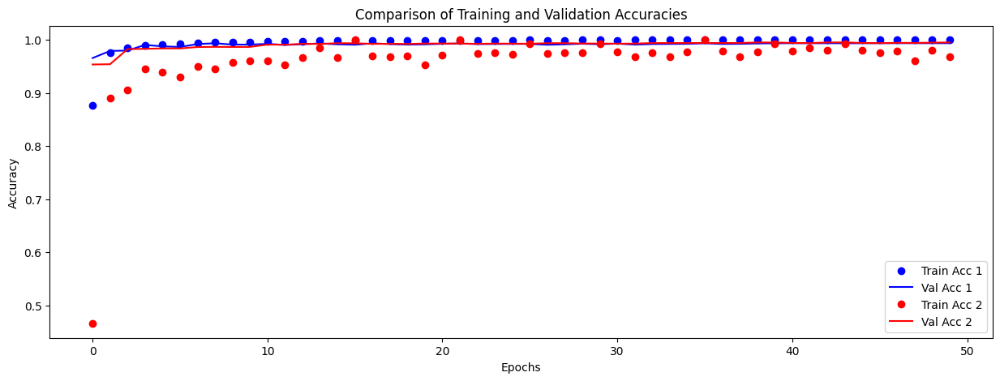

In [38]:
# Compare the accuracies of three training processes
acc1 = history1.history['acc']
val_acc1 = history1.history['val_acc']
acc2 = history2.history['acc']
val_acc2 = history2.history['val_acc']

PlotTwoAccuracyComparison(acc1, val_acc1, acc2, val_acc2, 'Model 1', 'Model 2')

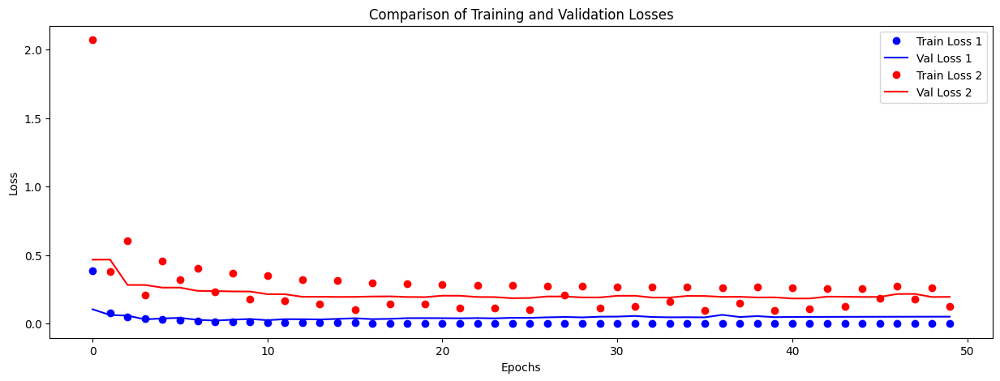

In [39]:
# Compare the losses of three training processes
loss1 = history1.history['loss']
val_loss1 = history1.history['val_loss']
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']

PlotTwoLossComparison(loss1, val_loss1, loss2, val_loss2, 'Model 1', 'Model 2')

In [40]:
LABELS= ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

# Define the confusion matrix for the results
def show_confusion_matrix(validations, predictions, num_classes):
    matrix = metrics.confusion_matrix(validations, predictions)
    plt.figure(figsize=(num_classes, num_classes))
    hm = sns.heatmap(matrix,
                cmap='coolwarm',
                linecolor='white',
                linewidths=1,
                xticklabels=LABELS,
                yticklabels=LABELS,
                annot=True,
                fmt='d')
    plt.yticks(rotation = 0)  # Don't rotate (vertically) the y-axis labels
    #hm.invert_yaxis() # Invert the labels of the y-axis
    hm.set_ylim(0, len(matrix))
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

Validation loss: 0.1949690729379654
Validation accuracy: 0.995199978351593
313/313 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step


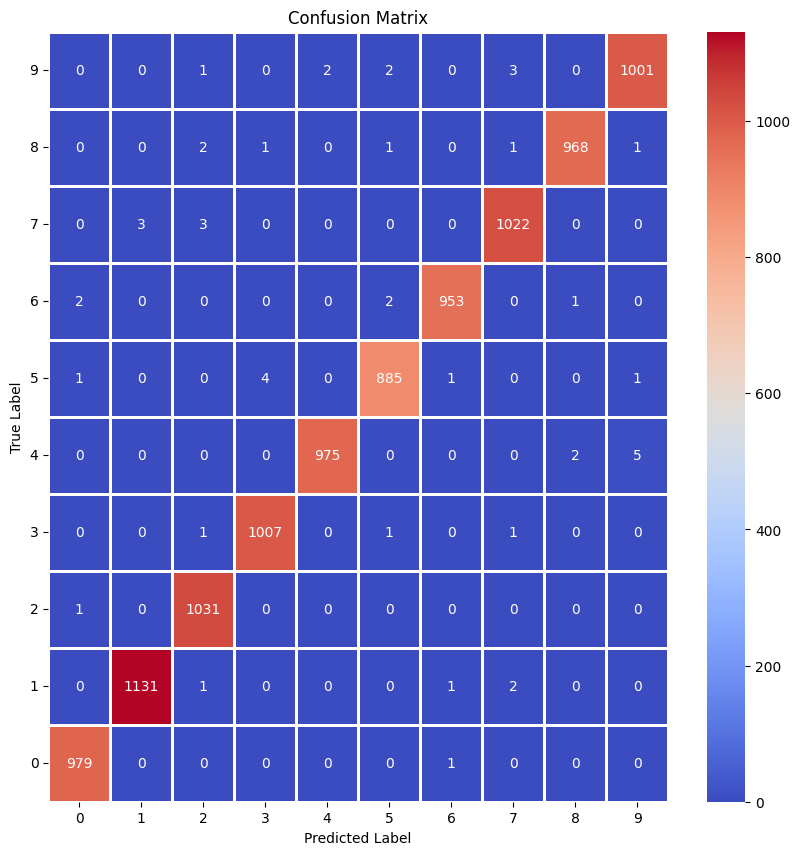

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135
           2       0.99      1.00      1.00      1032
           3       1.00      1.00      1.00      1010
           4       1.00      0.99      1.00       982
           5       0.99      0.99      0.99       892
           6       1.00      0.99      1.00       958
           7       0.99      0.99      0.99      1028
           8       1.00      0.99      1.00       974
           9       0.99      0.99      0.99      1009

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [41]:
# Evaluate the model and print out the final scores for the val set
score = model2.evaluate(x_val, y_val, verbose=0)  # evaluate the model on the val set
print('Validation loss:', score[0])      # print out the loss = score[0] (generalization error) 
print('Validation accuracy:', score[1])  # print out the generalization accuracy = score[1] of the model on val set

# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model2.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  48
Misclassified examples:
[ 445  582  716 1039 1178 1226 1232 1260 1393 1621 1681 1878 1901 2035
 2130 2454 2462 2597 2939 3060 3073 3422 3534 3558 3762 4078 4201 4284
 4443 4497 4740 4860 5654 5937 5997 6558 6571 6576 6625 6783 8061 8279
 8316 8408 8527 9642 9729 9792]
Misclassified images (original class : predicted class):


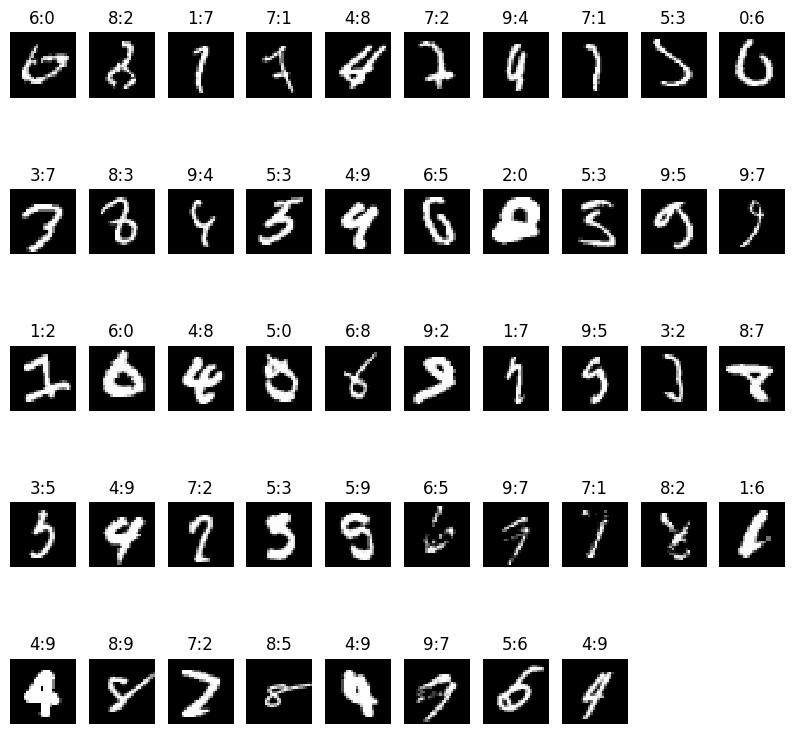

In [42]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]].reshape(img_rows, img_cols)) # index of the val sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Porównanie wyników wykazało, że nasz drugi model osiąga wyższą dokładność niż model wcześniejszy (prostszy).

Nadal możesz próbować zmieniać hiperparametry modelu i osiągać jeszcze lepsze wyniki!

## Przykład trenowania i walidacji ConvNet na zbiorze danych CIFAR-10

Przyjrzyjmy się innemu przykładowi splotowej sieci neuronowej użytej do klasyfikacji danych CIFAR-10.

Teraz użyjemy obrazów RGB o wymiarach 32 x 32 pikseli i podzielimy je na 10 klas.

Dane uczące zawierają 50 000 obrazów, a zestaw danych testowych składa się z 10 000 obrazów.

In [43]:
from keras.datasets import cifar10 # gets CIFAR-10 dataset from repository

# Define hyperparameters
num_classes = 10 # number of classes of images

# Input image dimensions
img_rows, img_cols = 32, 32

# Split the data between train and val sets
(x_train, y_train), (x_val, y_val) = cifar10.load_data() # 50000 training and 10000 validating examples

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 37s 0us/step


<Figure size 250x250 with 0 Axes>

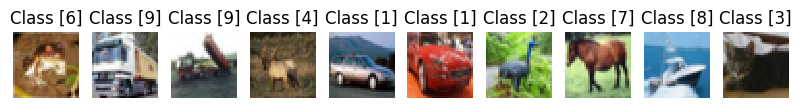

<Figure size 100x100 with 0 Axes>

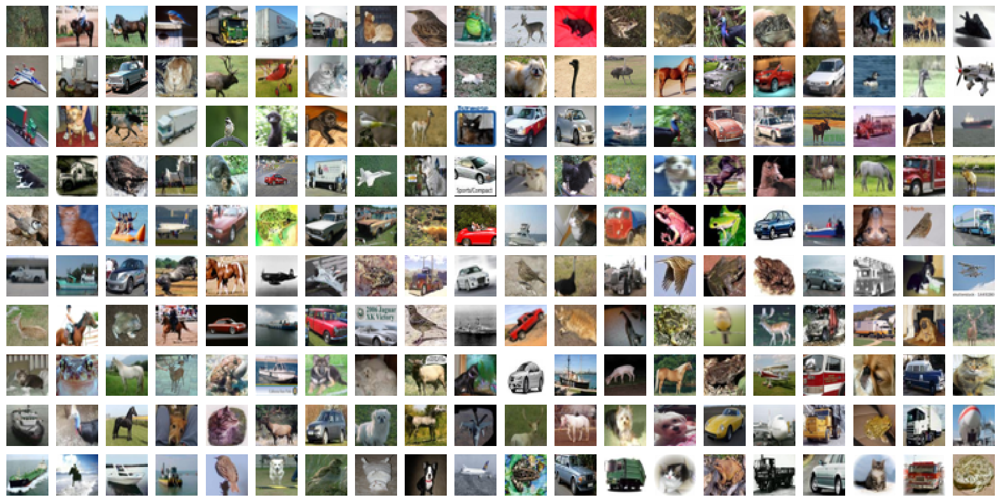

In [44]:
# Show a few sample images from the training set
#plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
plt.figure(figsize=(2.5,2.5))
col1 = 10
row1 = 1
fig = plt.figure(figsize=(col1, row1))
for index in range(0, col1*row1):
    fig.add_subplot(row1, col1, index + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
    plt.title("Class " + str(y_train[index]))
plt.show()
    
# Show a few sample digits from the training set
#plt.rcParams['figure.figsize'] = (1.0, 1.0) # set default size of plots
plt.figure(figsize=(1.0,1.0))
col2 = 20
row2 = 10
fig = plt.figure(figsize=(col2, row2))
for index in range(col1*row1, col1*row1 + col2*row2):
    fig.add_subplot(row2, col2, index - col1*row1 + 1)
    plt.axis('off')
    plt.imshow(x_train[index]) # index of the sample picture
plt.show()

In [45]:
# According to the different formats reshape training and validating data
if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 3, img_rows, img_cols)
    x_val = x_val.reshape(x_val.shape[0], 3, img_rows, img_cols)
    input_shape = (3, img_rows, img_cols)
else:
    x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 3)
    x_val = x_val.reshape(x_val.shape[0], img_rows, img_cols, 3)
    input_shape = (img_rows, img_cols, 3)

# Transform training and validating data and show their shapes
x_train = x_train.astype('float32')   # Copy this array and cast it to a specified type
x_val = x_val.astype('float32')     # Copy this array and cast it to a specified type
x_train /= 255 # Transfrom the training data from the range of 0 and 255 to the range of 0 and 1
x_val /= 255  # Transfrom the validating data from the range of 0 and 255 to the range of 0 and 1
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_val.shape[0], 'validating samples')

# Convert class vectors to binary class matrices
y_train = tensorflow.keras.utils.to_categorical(y_train, num_classes)
y_val = tensorflow.keras.utils.to_categorical(y_val, num_classes)

x_train shape: (50000, 32, 32, 3)
50000 train samples
10000 validating samples


### Utwórz model dla tego zbioru danych

In [46]:
# Define the sequential Keras model composed of a few layers
model3 = Sequential()   # establishes the type of the network model
# Conv2D - creates a convolutional layer (https://keras.io/layers/convolutional/#conv2d) with 
# filters - specified number of convolutional filters
# kernel_size - defines the frame (sliding window) size where the convolutional filter is implemented
# activation - sets the activation function for this layers, here ReLU
# input_shape - defines the shape of the input matrix (vector), here input_shape = (1, img_rows, img_cols)
model3.add(Conv2D(64, kernel_size=(3, 3),activation='relu', input_shape=input_shape))
model3.add(Conv2D(64, (3, 3), activation='relu'))
# MaxPooling2D pools the max value from the frame (sliding window) of 2 x 2 size
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.25)) # Implements the drop out with the probability of 0.25
model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
#model3.add(Conv2D(128, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
model3.add(Conv2D(256, (3, 3), activation='relu',padding='same'))
model3.add(MaxPooling2D(pool_size=(2, 2)))
model3.add(Dropout(0.35))
# Finish the convolutional model and flatten the layer which does not affect the batch size.
model3.add(Flatten())
# Use a dense layer (MLP) consisting of 256 neurons with relu activation functions
model3.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001))) #512
model3.add(Dropout(0.5))
model3.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001))) #256
model3.add(Dropout(0.3))
model3.add(Dense(num_classes, activation='softmax'))

# Now print the full model and notice the number of all trainable paramters
print(model2.summary())

/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 26, 26, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 13, 13, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 6, 6, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 3, 3, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 3, 3, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 3, 3, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,518,112 (9.61 MB)

 Trainable params: 839,370 (3.20 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,678,742 (6.40 MB)

None


In [47]:
# Define hyperparameters
batch_size = 512 # size of mini-baches
epochs = 50      # how many times all traing examples will be used to train the model

# Compile the model using optimizer
opt = tensorflow.keras.optimizers.Adam(learning_rate=0.001) #, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, name="Adam") # https://keras.io/api/optimizers/adam/
#opt = optimizers.Adadelta(learning_rate=0.001, rho=0.95, epsilon=1e-07, name="Adadelta", **kwargs)  # https://keras.io/api/optimizers/adadelta/
#opt = optimizers.Adagrad(learning_rate=0.001, initial_accumulator_value=0.1, epsilon=1e-07, name="Adagrad", **kwargs)  # https://keras.io/api/optimizers/adagrad/
#opt = optimizers.Adamax(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Adamax", **kwargs)  # https://keras.io/api/optimizers/adamax/
#opt = optimizers.Nadam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, name="Nadam", **kwargs)  # https://keras.io/api/optimizers/Nadam/
#opt = optimizers.Ftrl(learning_rate=0.001, learning_rate_power=-0.5, initial_accumulator_value=0.1, l1_regularization_strength=0.0, l2_regularization_strength=0.0, name="Ftrl", l2_shrinkage_regularization_strength=0.0, beta=0.0, **kwargs)  # https://keras.io/api/optimizers/ftrl/
#opt = optimizers.RMSprop(learning_rate=0.001, rho=0.9, momentum=0.0, epsilon=1e-07, centered=False, name="RMSprop", **kwargs) # https://keras.io/api/optimizers/rmsprop/
#opt = optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False, name="SGD", **kwargs)  # https://keras.io/api/optimizers/sgd/
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=opt,
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
#history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history=model3.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

Epoch 1/50


/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


97/97 ━━━━━━━━━━━━━━━━━━━━ 565s 6s/step - acc: 0.1501 - loss: 2.6098 - val_acc: 0.3352 - val_loss: 1.9113 - learning_rate: 0.0010
Epoch 2/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 9:12 6s/step - acc: 0.2832 - loss: 2.0005

2024-04-19 22:05:22.351460: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/Users/maciekadamus/opt/anaconda3/envs/ggsn/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 192ms/step - acc: 0.2832 - loss: 1.0106 - val_acc: 0.3483 - val_loss: 1.8935 - learning_rate: 0.0010
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 474s 5s/step - acc: 0.3291 - loss: 1.8845 - val_acc: 0.4742 - val_loss: 1.5557 - learning_rate: 0.0010
Epoch 4/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:45 5s/step - acc: 0.4102 - loss: 1.6626

2024-04-19 22:13:39.269344: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 183ms/step - acc: 0.4102 - loss: 0.8399 - val_acc: 0.4570 - val_loss: 1.5848 - learning_rate: 0.0010
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 431s 4s/step - acc: 0.4209 - loss: 1.6635 - val_acc: 0.5381 - val_loss: 1.3721 - learning_rate: 0.0010
Epoch 6/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:30 4s/step - acc: 0.5137 - loss: 1.4977

2024-04-19 22:21:12.211214: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - acc: 0.5137 - loss: 0.7566 - val_acc: 0.5246 - val_loss: 1.3931 - learning_rate: 0.0010
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 443s 5s/step - acc: 0.4808 - loss: 1.5140 - val_acc: 0.5600 - val_loss: 1.3070 - learning_rate: 0.0010
Epoch 8/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:47 4s/step - acc: 0.5293 - loss: 1.4470

2024-04-19 22:28:58.012487: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 180ms/step - acc: 0.5293 - loss: 0.7309 - val_acc: 0.5391 - val_loss: 1.3472 - learning_rate: 0.0010
Epoch 9/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 429s 4s/step - acc: 0.5160 - loss: 1.4458 - val_acc: 0.5763 - val_loss: 1.2602 - learning_rate: 0.0010
Epoch 10/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:49 4s/step - acc: 0.5059 - loss: 1.4677

2024-04-19 22:36:29.019939: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 181ms/step - acc: 0.5059 - loss: 0.7414 - val_acc: 0.5866 - val_loss: 1.2322 - learning_rate: 0.0010
Epoch 11/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 755s 8s/step - acc: 0.5407 - loss: 1.3724 - val_acc: 0.6460 - val_loss: 1.1042 - learning_rate: 0.0010
Epoch 12/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:43 5s/step - acc: 0.5469 - loss: 1.3180

2024-04-19 22:49:27.157323: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 192ms/step - acc: 0.5469 - loss: 0.6658 - val_acc: 0.6407 - val_loss: 1.1200 - learning_rate: 0.0010
Epoch 13/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 467s 5s/step - acc: 0.5722 - loss: 1.3012 - val_acc: 0.6432 - val_loss: 1.1022 - learning_rate: 0.0010
Epoch 14/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:12 5s/step - acc: 0.5840 - loss: 1.3233

2024-04-19 22:57:37.622401: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - acc: 0.5840 - loss: 0.6685 - val_acc: 0.6446 - val_loss: 1.1093 - learning_rate: 0.0010
Epoch 15/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 455s 5s/step - acc: 0.5916 - loss: 1.2506 - val_acc: 0.6549 - val_loss: 1.0686 - learning_rate: 0.0010
Epoch 16/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:54 5s/step - acc: 0.6055 - loss: 1.1184

2024-04-19 23:05:36.481851: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 189ms/step - acc: 0.6055 - loss: 0.5650 - val_acc: 0.6426 - val_loss: 1.0874 - learning_rate: 0.0010
Epoch 17/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 433s 4s/step - acc: 0.6036 - loss: 1.2228 - val_acc: 0.6751 - val_loss: 1.0303 - learning_rate: 0.0010
Epoch 18/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:01 4s/step - acc: 0.5801 - loss: 1.2743

2024-04-19 23:13:11.804168: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - acc: 0.5801 - loss: 0.6437 - val_acc: 0.6756 - val_loss: 1.0295 - learning_rate: 0.0010
Epoch 19/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 437s 4s/step - acc: 0.6241 - loss: 1.1727 - val_acc: 0.6924 - val_loss: 1.0149 - learning_rate: 0.0010
Epoch 20/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:55 4s/step - acc: 0.6445 - loss: 1.1782

2024-04-19 23:20:52.852234: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 198ms/step - acc: 0.6445 - loss: 0.5952 - val_acc: 0.6994 - val_loss: 0.9790 - learning_rate: 0.0010
Epoch 21/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 477s 4s/step - acc: 0.6334 - loss: 1.1535 - val_acc: 0.6897 - val_loss: 0.9856 - learning_rate: 0.0010
Epoch 22/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:58 5s/step - acc: 0.6367 - loss: 1.1010

2024-04-19 23:29:14.336026: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 196ms/step - acc: 0.6367 - loss: 0.5562 - val_acc: 0.6788 - val_loss: 1.0212 - learning_rate: 0.0010
Epoch 23/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 435s 4s/step - acc: 0.6449 - loss: 1.1247 - val_acc: 0.6876 - val_loss: 0.9892 - learning_rate: 0.0010
Epoch 24/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:19 5s/step - acc: 0.6426 - loss: 1.0804

2024-04-19 23:36:52.378717: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 200ms/step - acc: 0.6426 - loss: 0.5458 - val_acc: 0.6810 - val_loss: 1.0161 - learning_rate: 0.0010
Epoch 25/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 446s 5s/step - acc: 0.6506 - loss: 1.0995 - val_acc: 0.7094 - val_loss: 0.9409 - learning_rate: 0.0010
Epoch 26/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:53 5s/step - acc: 0.7109 - loss: 1.0046

2024-04-19 23:44:42.645827: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - acc: 0.7109 - loss: 0.5075 - val_acc: 0.7191 - val_loss: 0.9089 - learning_rate: 0.0010
Epoch 27/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 441s 4s/step - acc: 0.6666 - loss: 1.0698 - val_acc: 0.7177 - val_loss: 0.9177 - learning_rate: 0.0010
Epoch 28/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:47 4s/step - acc: 0.6465 - loss: 1.0992

2024-04-19 23:52:24.825661: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 177ms/step - acc: 0.6465 - loss: 0.5553 - val_acc: 0.7172 - val_loss: 0.9196 - learning_rate: 0.0010
Epoch 29/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 447s 5s/step - acc: 0.6671 - loss: 1.0648 - val_acc: 0.7164 - val_loss: 0.9138 - learning_rate: 0.0010
Epoch 30/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 10:21 6s/step - acc: 0.6777 - loss: 1.0296

2024-04-20 00:00:15.454648: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 182ms/step - acc: 0.6777 - loss: 0.5201 - val_acc: 0.7248 - val_loss: 0.8942 - learning_rate: 0.0010
Epoch 31/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 434s 4s/step - acc: 0.6760 - loss: 1.0445 - val_acc: 0.7232 - val_loss: 0.8971 - learning_rate: 0.0010
Epoch 32/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:56 4s/step - acc: 0.7109 - loss: 1.0204

2024-04-20 00:07:51.635753: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 184ms/step - acc: 0.7109 - loss: 0.5155 - val_acc: 0.7227 - val_loss: 0.9016 - learning_rate: 0.0010
Epoch 33/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 442s 5s/step - acc: 0.6848 - loss: 1.0272 - val_acc: 0.7312 - val_loss: 0.8646 - learning_rate: 0.0010
Epoch 34/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:11 5s/step - acc: 0.6953 - loss: 0.9701

2024-04-20 00:15:36.816853: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 180ms/step - acc: 0.6953 - loss: 0.4901 - val_acc: 0.7420 - val_loss: 0.8425 - learning_rate: 0.0010
Epoch 35/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 426s 4s/step - acc: 0.6846 - loss: 1.0224 - val_acc: 0.7429 - val_loss: 0.8429 - learning_rate: 0.0010
Epoch 36/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:47 4s/step - acc: 0.6973 - loss: 1.0201

2024-04-20 00:23:04.229225: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 191ms/step - acc: 0.6973 - loss: 0.5153 - val_acc: 0.7323 - val_loss: 0.8743 - learning_rate: 0.0010
Epoch 37/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 449s 5s/step - acc: 0.6908 - loss: 1.0063 - val_acc: 0.7459 - val_loss: 0.8376 - learning_rate: 0.0010
Epoch 38/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 6:04 4s/step - acc: 0.6504 - loss: 1.1167

2024-04-20 00:30:55.223488: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - acc: 0.6504 - loss: 0.5641 - val_acc: 0.7507 - val_loss: 0.8150 - learning_rate: 0.0010
Epoch 39/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 443s 5s/step - acc: 0.6966 - loss: 0.9976 - val_acc: 0.7515 - val_loss: 0.8265 - learning_rate: 0.0010
Epoch 40/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 10:11 6s/step - acc: 0.6914 - loss: 0.9952

2024-04-20 00:38:40.514529: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 25s 193ms/step - acc: 0.6914 - loss: 0.5027 - val_acc: 0.7497 - val_loss: 0.8309 - learning_rate: 0.0010
Epoch 41/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 461s 5s/step - acc: 0.7026 - loss: 0.9771 - val_acc: 0.7578 - val_loss: 0.8032 - learning_rate: 0.0010
Epoch 42/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:10 4s/step - acc: 0.6953 - loss: 0.9650

2024-04-20 00:46:44.212857: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 194ms/step - acc: 0.6953 - loss: 0.4875 - val_acc: 0.7605 - val_loss: 0.8019 - learning_rate: 0.0010
Epoch 43/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 466s 5s/step - acc: 0.7007 - loss: 0.9758 - val_acc: 0.7476 - val_loss: 0.8488 - learning_rate: 0.0010
Epoch 44/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:37 5s/step - acc: 0.6855 - loss: 1.0545

2024-04-20 00:54:53.960117: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 189ms/step - acc: 0.6855 - loss: 0.5327 - val_acc: 0.7588 - val_loss: 0.8143 - learning_rate: 0.0010
Epoch 45/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 474s 5s/step - acc: 0.7105 - loss: 0.9589 - val_acc: 0.7371 - val_loss: 0.8713 - learning_rate: 0.0010
Epoch 46/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:39 5s/step - acc: 0.7129 - loss: 0.9496

2024-04-20 01:03:11.502569: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 183ms/step - acc: 0.7129 - loss: 0.4797 - val_acc: 0.7507 - val_loss: 0.8226 - learning_rate: 0.0010
Epoch 47/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 440s 4s/step - acc: 0.7095 - loss: 0.9500 - val_acc: 0.7612 - val_loss: 0.8006 - learning_rate: 0.0010
Epoch 48/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 7:42 5s/step - acc: 0.6895 - loss: 1.0082

2024-04-20 01:10:53.450111: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 184ms/step - acc: 0.6895 - loss: 0.5093 - val_acc: 0.7594 - val_loss: 0.7988 - learning_rate: 0.0010
Epoch 49/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 456s 5s/step - acc: 0.7136 - loss: 0.9289 - val_acc: 0.7566 - val_loss: 0.8050 - learning_rate: 0.0010
Epoch 50/50
 1/97 ━━━━━━━━━━━━━━━━━━━━ 8:21 5s/step - acc: 0.7305 - loss: 0.8738

2024-04-20 01:18:52.695369: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


97/97 ━━━━━━━━━━━━━━━━━━━━ 26s 218ms/step - acc: 0.7305 - loss: 0.4414 - val_acc: 0.7570 - val_loss: 0.8043 - learning_rate: 0.0010


In [48]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_1.h5')

Train loss: 0.7492388486862183
Train accuracy: 0.7752000093460083
Bias: 0.7752000093460083
Validation loss: 0.8043146133422852
Validation accuracy: 0.7570000290870667
Variance: -0.01819998025894165


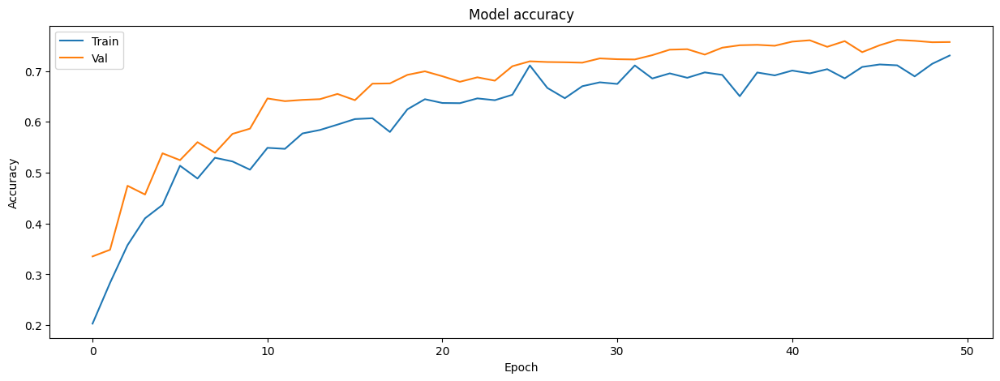

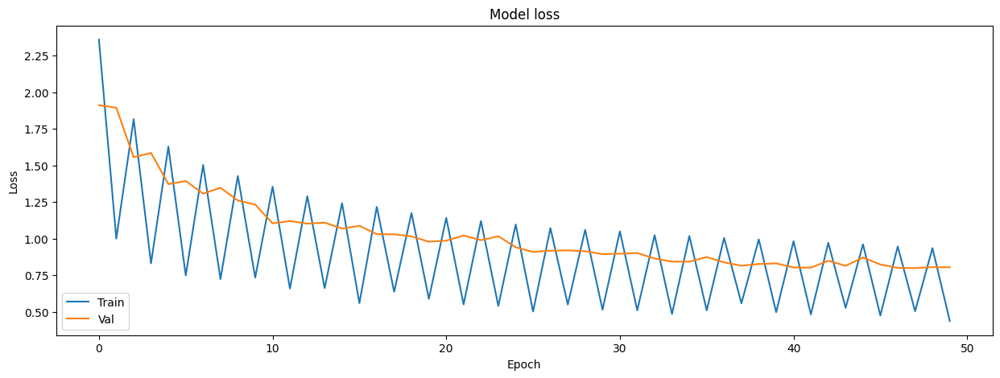

In [49]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Jak możemy zauważyć, wariancja jest ujemna (mniejsza niż 0). Czy powinniśmy się z tego cieszyć? Skąd to pochodzi? Tryb mini-batch i mechanizmy regularyzacji takie jak Dropout i regularyzacja wagi L1/L2 są wyłączone na czas walidacji, dzięki czemu model nie ulega adaptacji tak jak w czasie testowania. Dlatego błąd uczenia jest zwykle (zawsze) większy, co może wydawać się dziwne w świetle klasycznych modeli uczenia maszynowego. Z drugiej strony tak obliczona wariancja nie jest prawdziwa. Musielibyśmy ją obliczyć bez włączonych współczynników regularyzacji i na tej samej partii danych, aby wynik był porównywalny z błędem obliczonym dla danych testowych.

Błędy uczenia i walidacji w dalszym ciągu maleją, zatem szkolenie należy kontynuować, aby osiągnąć prawdopodobnie lepsze wyniki, zmniejszając obciążenie (bias) modelu, które po 50 epokach nie jest nadal zadowalające!

313/313 ━━━━━━━━━━━━━━━━━━━━ 24s 73ms/step


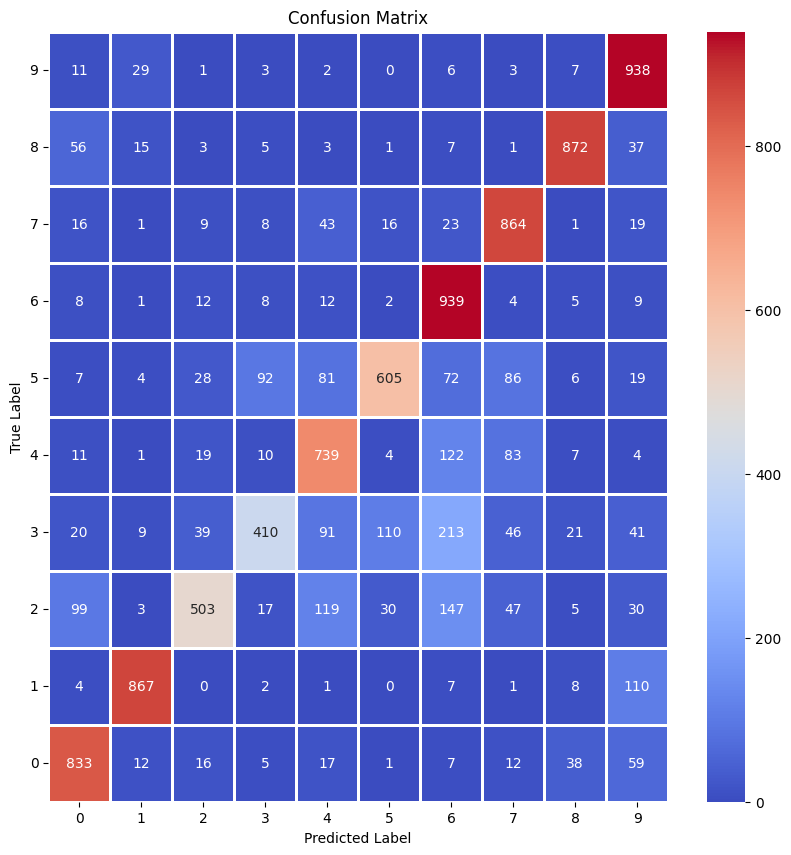

              precision    recall  f1-score   support

           0       0.78      0.83      0.81      1000
           1       0.92      0.87      0.89      1000
           2       0.80      0.50      0.62      1000
           3       0.73      0.41      0.53      1000
           4       0.67      0.74      0.70      1000
           5       0.79      0.60      0.68      1000
           6       0.61      0.94      0.74      1000
           7       0.75      0.86      0.80      1000
           8       0.90      0.87      0.89      1000
           9       0.74      0.94      0.83      1000

    accuracy                           0.76     10000
   macro avg       0.77      0.76      0.75     10000
weighted avg       0.77      0.76      0.75     10000



In [50]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

Number of misclassified examples:  2430
Misclassified examples:
[  12   24   25 ... 9989 9993 9996]
Misclassified images (original class : predicted class):


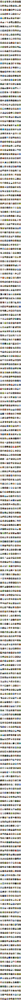

In [51]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Jak widzieliśmy, uczenie tego zbioru danych nie jest tak proste, jak uczenie zbioru MNIST.

Odchylenie modelu jest nadal wysokie, więc model jest niedopasowany. Jednakże wariancja modelu nie wydaje się być zła; jednak nie obliczyliśmy tutaj rzeczywistej wariancji, więc może to wprowadzać w błąd! Co więc musimy teraz zrobić z tym modelem, aby zmniejszyć wysokie odchylenie? Uczmy się tego samego modelu dłużej (przez kolejne sto epok) i zmieńmy rozmiar mini-partii z 512 na 256, aby dać modelowi możliwość nie wpadania tak szybko w lokalne minima lub punkty siodłowe.

Zatem teraz stosujemy __model opieki nad dziećmi__ (__strategia Pandy__), aby poprawić wydajność modelu:

In [52]:
# Define hyperparameters
batch_size = 256  # size of mini-baches
epochs = 100      # how many times all traing examples will be used to train this model further

# Compile the model using optimizer
model3.compile(loss=keras.losses.categorical_crossentropy,
               optimizer=keras.optimizers.Adadelta(),
               metrics=['acc']) # List of metrics to be evaluated by the model during training and validating: https://keras.io/models/model/#compile

# Learning rate reduction durint the training process: https://keras.io/callbacks/#reducelronplateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', # quantity to be monitored (val_loss)
                                            factor=0.5, # factor by which the learning rate will be reduced. new_lr = lr * factor
                                            patience=5, # number of epochs that produced the monitored quantity with no improvement after which training will be stopped
                                            verbose=1,  # 0: quiet, 1: update messages.
                                            min_lr=0.001) # lower bound on the learning rate

# Augmentation of training data. It generates batches of tensor image data with real-time data augmentation. The data will be looped over in batches.
datagen = ImageDataGenerator(
          rotation_range=20,       # rotate images in degrees up to the given degrees
          width_shift_range=0.1,   # shift images horizontally
          height_shift_range=0.1,  # shift images vertically
          horizontal_flip=True)    # flip images (left<->right)
# Computes the internal data stats related to the data-dependent transformations, based on an array of samples x_train
datagen.fit(x_train)

# Train the model, validate, evaluate, and present scores
#history=model3.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),
history=model3.fit(datagen.flow(x_train, y_train, batch_size=batch_size),
                            epochs=epochs,
                            steps_per_epoch=x_train.shape[0]//batch_size,  # no of mini-batches 
                            validation_data=(x_val, y_val),
                            verbose=1,
                            callbacks=[learning_rate_reduction])

In [ ]:
# Save weights of the model before training to enable to start training it again
model3.save(models_dir + 'CNN_CIFAR-10_2.h5')

In [ ]:
score_train = model3.evaluate(x_train, y_train, verbose=0)
print('Train loss:', score_train[0])
print('Train accuracy:', score_train[1])
print('Bias:', score_train[1])   # Assuming that the Bayes optimal error is equal to 0.

score_val = model3.evaluate(x_val, y_val, verbose=0)
print('Validation loss:', score_val[0])
print('Validation accuracy:', score_val[1])
print('Variance:', score_val[1] - score_train[1])

plt.rcParams['figure.figsize'] = (15.0, 5.0) # set default size of plots

# Plot training & validation accuracy values: https://keras.io/visualization/#training-history-visualization
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Val'], loc='upper left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values: https://keras.io/visualization/#training-history-visualizatio
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Val'], loc='lower left')  # OR plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
# Use the trained model for predictions of the val data (in this case, we use validation data as val data)
y_pred_val = model3.predict(x_val)

# Take the class with the highest probability from the val predictions as a winning one
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

# Show the confution matrix of the collected results
show_confusion_matrix(max_y_val, max_y_pred_val, num_classes)

# Print classification report
print(classification_report(max_y_val, max_y_pred_val))

In [ ]:
# Find out misclassified examples
classcheck = max_y_val - max_y_pred_val  # 0 - when the class is the same, 1 - otherwise
misclassified = np.where(classcheck != 0)[0]
num_misclassified = len(misclassified)

# Print misclassification report
print('Number of misclassified examples: ', str(num_misclassified))
print('Misclassified examples:')
print(misclassified)

# Show misclassified examples:
print('Misclassified images (original class : predicted class):')
plt.rcParams['figure.figsize'] = (2.5, 2.5) # set default size of plots
col = 10
row = 2 * math.ceil(num_misclassified / col)
fig = plt.figure(figsize=(col, row))
for index in range(0,num_misclassified):
    fig.add_subplot(row, col, index + 1 + col*(index//col))
    plt.axis('off')
    plt.imshow(x_val[misclassified[index]]) # index of the validation sample picture
    plt.title(str(max_y_val[misclassified[index]]) + ":" + str(max_y_pred_val[misclassified[index]]))
plt.show()

Po 100 epokach zwiększyliśmy dokładność modelu z 0,81 do 0,85, dzięki czemu liczba błędnie sklasyfikowanych przykładów walidacyjnych spadła o około kilkaset. Nasz model wciąż nie jest doskonały. Nadszedł czas na Ciebie! Co proponujecie zrobić z tym modelem, żeby działał lepiej od prezentowanego modelu? Zrealizuj swoje pomysły w poniższych zadaniach.

## ZADANIA

* Skopiuj i wklej opracowany powyżej model do komórek poniżej.
* Modyfikuj hiperparametry modelu (struktura, liczba warstw w sieci i liczba filtrów na warstwę splotu, parametry zaniku itp.) i uzyskaj lepszą dokładność dla obu modeli: MNIST i CIFAR-10.
* Zmniejsz duże obciążenie modelu CIFAR-10, nie zwiększając ani nawet nie zmniejszając wariancji modelu.
* Porównaj dokładność i straty swojego modelu z wcześniej wyszkolonymi modelami (PlotTwoAccuracyComparison i PlotTwoLossComparison).
* Spróbuj przeprowadzić podobne eksperymenty na innym zbiorze danych szkoleniowych obrazów, np. pobrany z <a href="www.kaggle.com">Kaggle.com</a> lub innego źródła. Utwórz nowy model CNN i zaimplementuj regularyzacje oraz inne metody optymalizacji, próbując zmniejszyć obciążenie i wariancję modelu.

* Wyślij opracowany model CNN jako odpowiedź do tego zadania na MS Teams.